In [1]:
import torch
import numpy as np
from PIL import Image
from transformers import SamModel, SamProcessor, AutoModel, AutoProcessor, AutoModelForZeroShotObjectDetection
import cv2
import requests
from io import BytesIO

/opt/miniconda3/envs/MAK-Minh/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
sam_model = SamModel.from_pretrained("facebook/sam-vit-base").to(device)
sam_processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

model = AutoModel.from_pretrained(
        'nvidia/DAM-3B-Self-Contained',
        trust_remote_code=True,
        torch_dtype='torch.float16'
    ).to("cuda")
dam = model.init_dam(conv_mode='v1', prompt_mode='full+focal_crop')

Loading checkpoint shards: 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]


Number of mask channels: 1


## Generate candidat answers

Running inference with input_points: [[[1172, 812], [1572, 800]]]


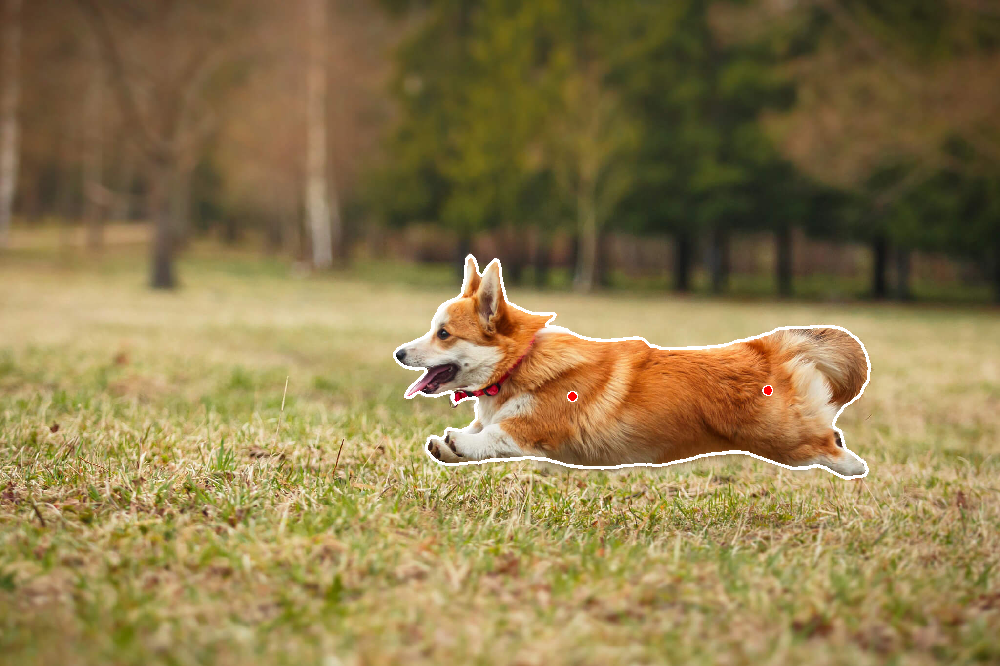

Description:
Candidates: orange(0.75), white(0.45), brown(0.15), tan(0.05), black(0.02)
Running inference with input_boxes: [[[800, 500, 1800, 1000]]]


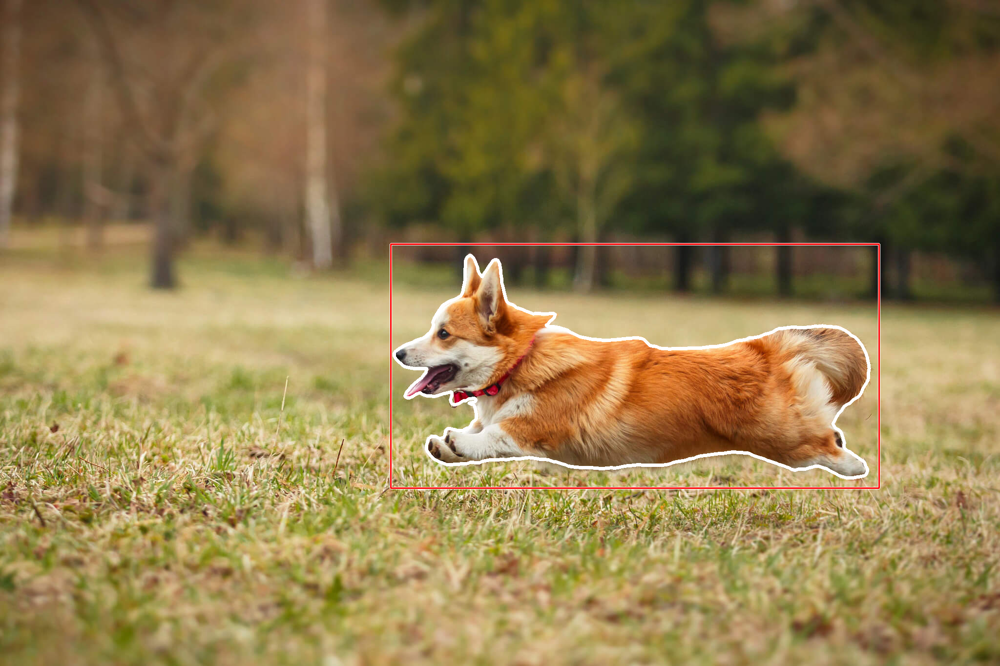

Description:
Candidates: orange(0.75), white(0.40), brown(0.15), red(0.98), gray(0.02)


In [3]:
# Copyright 2025 NVIDIA CORPORATION & AFFILIATES. All rights reserved.
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#     http://www.apache.org/licenses/LICENSE-2.0
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# SPDX-License-Identifier: Apache-2.0


def apply_sam(image, input_points=None, input_boxes=None, input_labels=None):
    inputs = sam_processor(image, input_points=input_points, input_boxes=input_boxes,
                           input_labels=input_labels, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = sam_model(**inputs)

    masks = sam_processor.image_processor.post_process_masks(
        outputs.pred_masks.cpu(),
        inputs["original_sizes"].cpu(),
        inputs["reshaped_input_sizes"].cpu()
    )[0][0]
    scores = outputs.iou_scores[0, 0]

    mask_selection_index = scores.argmax()
    mask_np = masks[mask_selection_index].numpy()
    return mask_np


def add_contour(img, mask, input_points=None, input_boxes=None):
    img = img.copy()
    mask = mask.astype(np.uint8) * 255
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img, contours, -1, (1.0, 1.0, 1.0), thickness=6)

    if input_points is not None:
        for points in input_points:
            for x, y in points:
                cv2.circle(img, (int(x), int(y)), radius=10, color=(1.0, 0.0, 0.0), thickness=-1)
                cv2.circle(img, (int(x), int(y)), radius=10, color=(1.0, 1.0, 1.0), thickness=2)

    if input_boxes is not None:
        for box_batch in input_boxes:
            for box in box_batch:
                x1, y1, x2, y2 = map(int, box)
                cv2.rectangle(img, (x1, y1), (x2, y2), color=(1.0, 1.0, 1.0), thickness=4)
                cv2.rectangle(img, (x1, y1), (x2, y2), color=(1.0, 0.0, 0.0), thickness=2)

    return img

def print_streaming(text):
    print(text, end="", flush=True)

if __name__ == '__main__':
    # Download the image via HTTP
    image_url = 'https://github.com/NVlabs/describe-anything/blob/main/images/1.jpg?raw=true'
    response = requests.get(image_url)
    img = Image.open(BytesIO(response.content)).convert('RGB')
    image_size = img.size  # (width, height)


    # Define two runs: one with points, one with box
    runs = [
        {
            'use_box': False,
            'points': [[1172, 812], [1572, 800]],
            'output_image_path': 'output_visualization_points.png'
        },
        {
            'use_box': True,
            'box': [800, 500, 1800, 1000],
            'output_image_path': 'output_visualization_box.png'
        }
    ]

    for run in runs:
        if run['use_box']:
            # Prepare box input
            coords = run['box']
            input_boxes = [[coords]]
            print(f"Running inference with input_boxes: {input_boxes}")
            mask_np = apply_sam(img, input_boxes=input_boxes)
            vis_points = None
            vis_boxes = input_boxes
        else:
            # Prepare point input
            pts = run['points']
            input_points = [pts]
            input_labels = [[1] * len(pts)]
            print(f"Running inference with input_points: {input_points}")
            mask_np = apply_sam(img, input_points=input_points, input_labels=input_labels)
            vis_points = input_points
            vis_boxes = None

        # Convert mask and describe
        mask = Image.fromarray((mask_np * 255).astype(np.uint8))
        # Save visualization with contour
        img_np = np.asarray(img).astype(float) / 255.0
        img_with_contour_np = add_contour(img_np, mask_np,
                                          input_points=vis_points,
                                          input_boxes=vis_boxes)
        img_with_contour_pil = Image.fromarray((img_with_contour_np * 255.0).astype(np.uint8))
        img_with_contour_pil.save(run['output_image_path'])
        # print(f"Output image with contour saved as {run['output_image_path']}")
        display(img_with_contour_pil)
        question = "What color is the dog's fur?"
        print("Description:")
        for token in dam.get_description(
            img,
            mask,
            f"""<image>\nYou are a Visual Question Answering system.
                Given an image and a question, you must propose the top 5 candidate answers, each with a confidence score (from 0.00 to 1.00), sorted in descending order.
                – Base your answers only on clearly visible information in the image, without any external inference.
                – Output only one line in the following exact format:
                Candidates: answer1(score1), answer2(score2), answer3(score3), answer4(score4), answer5(score5)

                Example 1:
                Question: What color is the car in the image?
                Candidates: red(0.98), orange(0.75), yellow(0.40), brown(0.15), white(0.05)

                Example 2:
                Question: How many people are visible?
                Candidates: two(0.92), three(0.60), one(0.30), four(0.10), zero(0.02)

                Now apply to the new case:

                Question: {question.strip()}
                Answer:""",
            streaming=True,
            temperature=0.2,
            top_p=0.5,
            num_beams=1,
            max_new_tokens=512
        ):
            print_streaming(token)
        print()  # newline

## Generate candidates caption

Running inference with input_boxes: [[[800, 500, 1800, 1000]]]


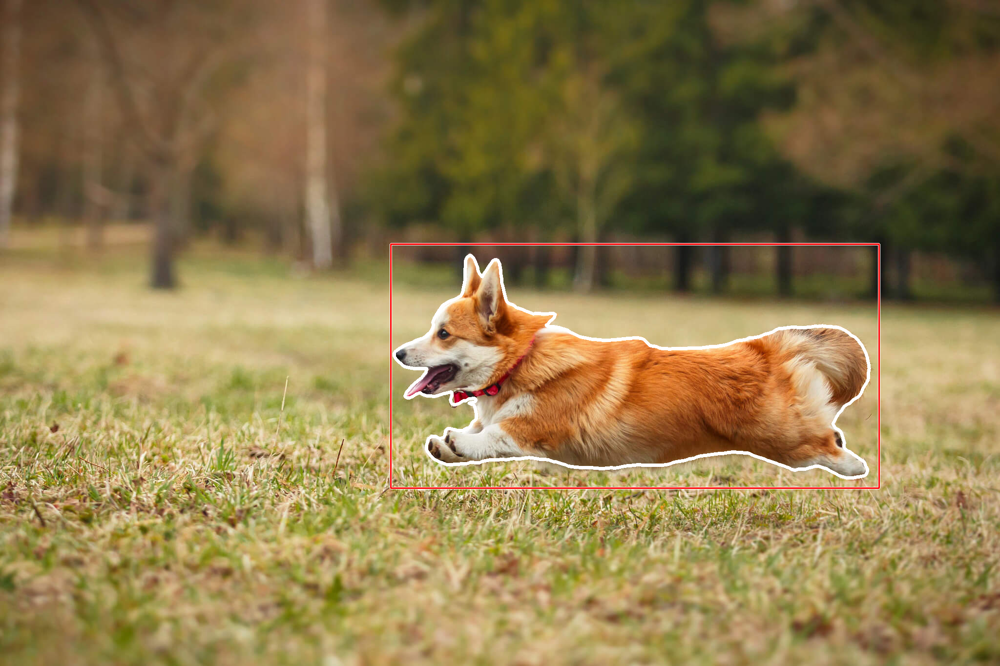

Candidates:

1. The dog's fur is a rich, reddish-brown color with a smooth texture.
2. The dog's ears are pointed and stand upright, with a slight tuft of fur at the tips.
3. The dog's eyes are dark and alert, and its nose is black.
4. The dog's mouth is open, revealing its tongue and teeth, and it has a red collar around its neck.
5. The dog's legs are extended as it runs, with white fur on the paws.


In [10]:
if __name__ == '__main__':
    # Download the image via HTTP
    image_url = 'https://github.com/NVlabs/describe-anything/blob/main/images/1.jpg?raw=true'
    response = requests.get(image_url)
    img = Image.open(BytesIO(response.content)).convert('RGB')
    image_size = img.size  # (width, height)


    # Define two runs: one with points, one with box
    runs = [
        # {
        #     'use_box': False,
        #     'points': [[1172, 812], [1572, 800]],
        #     'output_image_path': 'output_visualization_points.png'
        # },
        {
            'use_box': True,
            'box': [800, 500, 1800, 1000],
            'output_image_path': 'output_visualization_box.png'
        }
    ]

    for run in runs:
        if run['use_box']:
            # Prepare box input
            coords = run['box']
            input_boxes = [[coords]]
            print(f"Running inference with input_boxes: {input_boxes}")
            mask_np = apply_sam(img, input_boxes=input_boxes)
            vis_points = None
            vis_boxes = input_boxes
        else:
            # Prepare point input
            pts = run['points']
            input_points = [pts]
            input_labels = [[1] * len(pts)]
            print(f"Running inference with input_points: {input_points}")
            mask_np = apply_sam(img, input_points=input_points,
                                input_labels=input_labels)
            vis_points = input_points
            vis_boxes = None

        # Convert mask and describe
        mask = Image.fromarray((mask_np * 255).astype(np.uint8))
        # Save visualization with contour
        img_np = np.asarray(img).astype(float) / 255.0
        img_with_contour_np = add_contour(img_np, mask_np,
                                          input_points=vis_points,
                                          input_boxes=vis_boxes)
        img_with_contour_pil = Image.fromarray(
            (img_with_contour_np * 255.0).astype(np.uint8))
        img_with_contour_pil.save(run['output_image_path'])
        # print(f"Output image with contour saved as {run['output_image_path']}")
        display(img_with_contour_pil)
        question = "What color is the dog's fur?"
        for token in dam.get_description(
            img,
            mask,
            f"""
                <image>
                    You are an image captioning assistant focused on a specific masked region (highlighted area).  

                    Output Format:
                    Candidates: <caption1>, <caption2>, <caption3>, <caption4>, <caption5>

                    – Each caption must be a concise quoted phrase (3–7 words).
                    - Captions must be **unique** and highlight **different** visual aspects (e.g., texture, color, pattern, shape).
                    – Do NOT output any other text, punctuation, or numbering beyond this line.  
                    – Always produce exactly five captions.

                    Example 1:
                    Candidates: "smooth round metallic surface", "shiny silver circular shape", "reflective metal disc", "steel ring detail", "polished round metal part"

                    Example 2:
                    Candidates: "green oval leaf texture", "veined leaf edge", "fresh leaf surface", "moist leaf detail", "leaf vein pattern"

                    Now apply to the image above:
                    Candidates:""",
            streaming=True,     
            temperature=0.2,
            top_p=0.5,
            num_beams=1,
            max_new_tokens=512
        ):
            print_streaming(token)
        print()  # newline

## DAM without bbox

In [ ]:
if __name__ == "__main__":
  image_url = 'https://github.com/NVlabs/describe-anything/blob/main/images/1.jpg?raw=true'
  resp = requests.get(image_url)
  resp.raise_for_status()
  img = Image.open(BytesIO(resp.content)).convert('RGB')

  full_mask = Image.new("L", img.size, 255)
  img_np = np.asarray(img).astype(float) / 255.0
  mask_np = (np.asarray(full_mask) > 0).astype(np.uint8)
  vis = add_contour(img_np, mask_np)
  result = Image.fromarray((vis * 255).astype(np.uint8))
  result.save("output_full_mask.png")
  print("Saved full-mask visualization to output_full_mask.png")
  # bạn có thể dùng result.show() nếu muốn mở ảnh lên

  # 5. Chuẩn bị prompt cho VQA
  question = "What color is the dog's fur?"
  prompt = f"""<image>\nYou are a Visual Question Answering system.
                Given an image and a question, you must propose the top 5 candidate answers, each with a confidence score (from 0.00 to 1.00), sorted in descending order.
                – Base your answers only on clearly visible information in the image, without any external inference.
                – Output only one line in the following exact format:
                Candidates: answer1(score1), answer2(score2), answer3(score3), answer4(score4), answer5(score5)

                Example 1:
                Question: What color is the car in the image?
                Candidates: red(0.98), orange(0.75), yellow(0.40), brown(0.15), white(0.05)

                Example 2:
                Question: How many people are visible?
                Candidates: two(0.92), three(0.60), one(0.30), four(0.10), zero(0.02)

                Now apply to the new case:

                Question: {question.strip()}
                Answer:"""

  # 6. Chạy DAM trên toàn ảnh
  print("Description:")
  for token in dam.get_description(
      img,
      full_mask,
      prompt,
      streaming=True,
      temperature=0.2,
      top_p=0.5,
      num_beams=1,
      max_new_tokens=512
  ):
    print_streaming(token)
  print()

## Grounding Dino DAM

In [3]:
def load_grounding_dino_transformers():
    """Tải model và processor của Grounding DINO từ Hugging Face."""
    model_id = "IDEA-Research/grounding-dino-tiny"
    print(f"Loading Grounding DINO model '{model_id}' from Hugging Face...")
    processor = AutoProcessor.from_pretrained(model_id)
    model = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(device)
    print("Grounding DINO model loaded.")
    return model, processor

In [4]:
def get_bbox_from_prompt_transformers(image, text_prompt, model, processor, box_threshold=0.35, text_threshold=0.25):
    """
    Sử dụng Grounding DINO (transformers) để lấy bbox từ prompt văn bản.
    """
    # Chuẩn bị đầu vào
    text_labels = [[text_prompt]] # Định dạng yêu cầu của processor
    inputs = processor(images=image, text=text_labels, return_tensors="pt").to(device)

    # Chạy inference
    with torch.no_grad():
        outputs = model(**inputs)

    # Xử lý kết quả đầu ra
    results = processor.post_process_grounded_object_detection(
        outputs,
        inputs.input_ids,
        box_threshold=box_threshold,
        text_threshold=text_threshold,
        target_sizes=[image.size[::-1]]  # (height, width)
    )
    
    # Lấy kết quả cho ảnh đầu tiên
    result = results[0]

    # Nếu không phát hiện được đối tượng, trả về None
    if len(result["scores"]) == 0:
        print(f"Warning: No object found for prompt '{text_prompt}'")
        return None

    # Lấy box có confidence score cao nhất
    best_box_index = torch.argmax(result["scores"])
    best_box = result["boxes"][best_box_index].tolist()
    confidence = result["scores"][best_box_index].item()
    
    print(f"Detected '{text_prompt}' with confidence {confidence:.2f} at location {best_box}")

    return best_box

Loading Grounding DINO model 'IDEA-Research/grounding-dino-tiny' from Hugging Face...
Grounding DINO model loaded.

----- Processing prompt: 'the dog' -----
Detected 'the dog' with confidence 0.98 at location [801.540771484375, 516.2127685546875, 1787.9228515625, 994.97802734375]


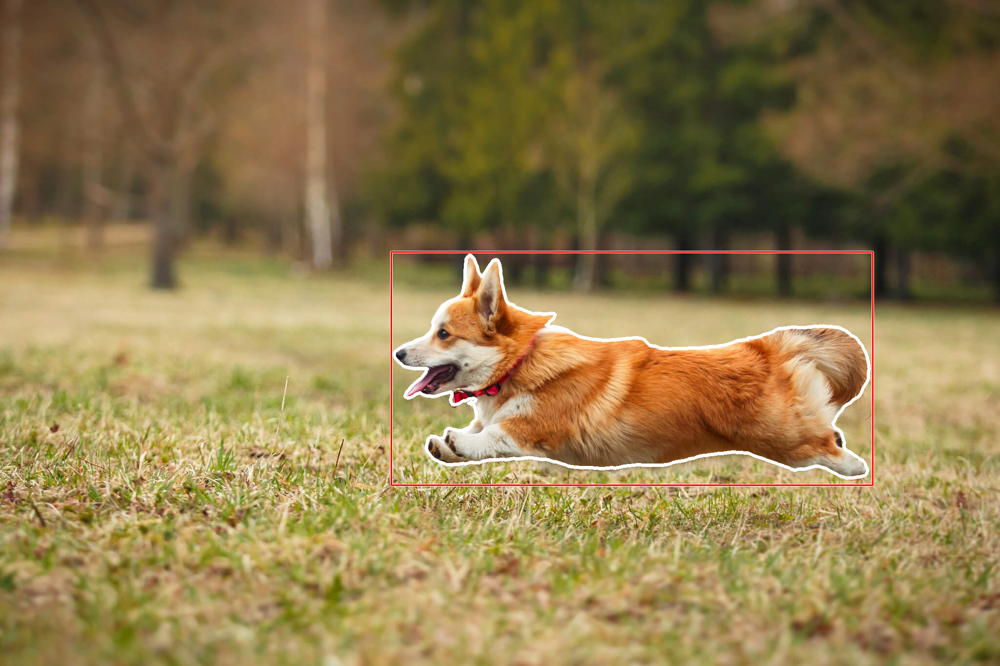

Question: What color is the dog's fur?
Description:
The object is a corgi dog, which is a small, short-haired breed of dog known for its distinctive appearance and agility. The corgi has a reddish-brown coat with white markings on its face, legs, and tail. It is wearing a red collar and is in a running pose with its mouth open, showing its teeth. The corgi is also known for its high energy and playfulness, making it a popular breed for activities such as agility competitions and dog sports.
--------------------------------------------------

----- Processing prompt: 'the green plant' -----
Detected 'the green plant' with confidence 0.39 at location [4.1021728515625, 698.0219116210938, 2043.5302734375, 1360.9842529296875]


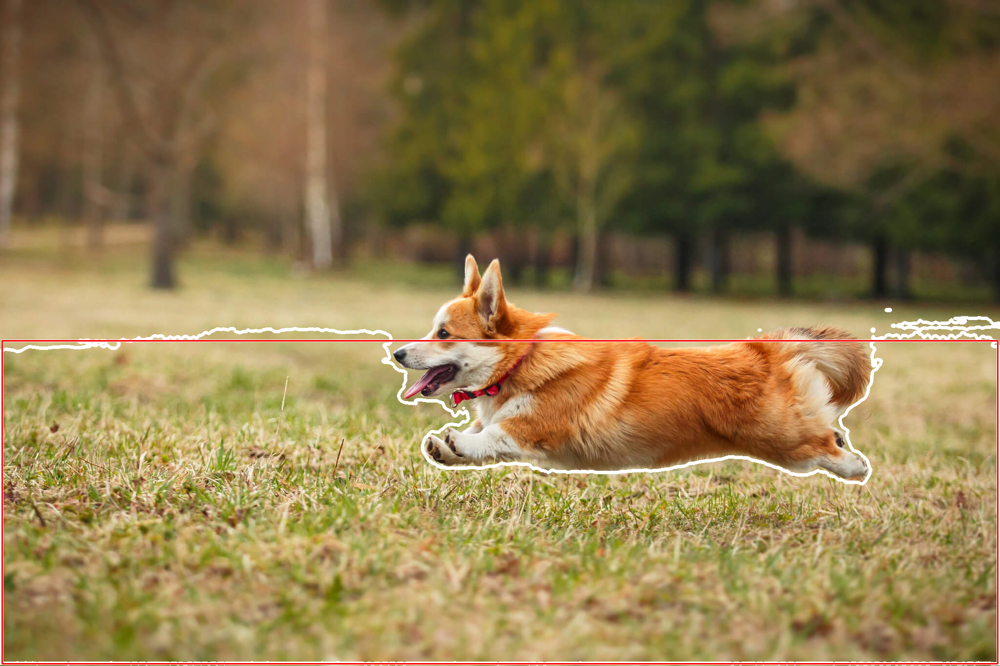

Question: What type of container is the plant in?
Description:
The object is a dog with a brown and white coat, lying on the ground. The dog is wearing a red collar.
--------------------------------------------------


In [5]:
def apply_sam(image, input_points=None, input_boxes=None, input_labels=None):
    inputs = sam_processor(image, input_points=input_points, input_boxes=input_boxes,
                           input_labels=input_labels, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = sam_model(**inputs)

    masks = sam_processor.image_processor.post_process_masks(
        outputs.pred_masks.cpu(),
        inputs["original_sizes"].cpu(),
        inputs["reshaped_input_sizes"].cpu()
    )[0][0]
    scores = outputs.iou_scores[0, 0]

    mask_selection_index = scores.argmax()
    mask_np = masks[mask_selection_index].numpy()
    return mask_np


def add_contour(img, mask, input_points=None, input_boxes=None):
    img = img.copy()
    mask = mask.astype(np.uint8) * 255
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img, contours, -1, (1.0, 1.0, 1.0), thickness=6)

    if input_points is not None:
        for points in input_points:
            for x, y in points:
                cv2.circle(img, (int(x), int(y)), radius=10, color=(1.0, 0.0, 0.0), thickness=-1)
                cv2.circle(img, (int(x), int(y)), radius=10, color=(1.0, 1.0, 1.0), thickness=2)

    if input_boxes is not None:
        for box_batch in input_boxes:
            for box in box_batch:
                x1, y1, x2, y2 = map(int, box)
                cv2.rectangle(img, (x1, y1), (x2, y2), color=(1.0, 1.0, 1.0), thickness=4)
                cv2.rectangle(img, (x1, y1), (x2, y2), color=(1.0, 0.0, 0.0), thickness=2)

    return img

def print_streaming(text):
    print(text, end="", flush=True)

if __name__ == '__main__':
    # Download the image via HTTP
    image_url = 'https://github.com/NVlabs/describe-anything/blob/main/images/1.jpg?raw=true'
    response = requests.get(image_url)
    img = Image.open(BytesIO(response.content)).convert('RGB')
    image_size = img.size  # (width, height)
    gd_model, gd_processor = load_grounding_dino_transformers()

    # Define two runs: one with points, one with box
    prompts_and_questions = [
            {
                "prompt": "the dog",
                "question": "What color is the dog's fur?",
                "output_path": "output_dog_description.png"
            },
            {
                "prompt": "the green plant",
                "question": "What type of container is the plant in?",
                "output_path": "output_plant_description.png"
            }
        ]

    for item in prompts_and_questions:
        text_prompt = item["prompt"]
        question = item["question"]
        output_image_path = item["output_path"]

        print(f"\n----- Processing prompt: '{text_prompt}' -----")

        # BƯỚC 1: Lấy BBox từ prompt bằng Grounding DINO (phiên bản transformers)
        bbox = get_bbox_from_prompt_transformers(img, text_prompt, gd_model, gd_processor)

        if bbox is None:
            continue

        # BƯỚC 2: Sử dụng BBox để lấy Mask từ SAM (không thay đổi)
        input_boxes = [[bbox]]
        mask_np = apply_sam(img, input_boxes=input_boxes)
        
        # BƯỚC 3: Trực quan hóa kết quả (không thay đổi)
        img_np = np.asarray(img).astype(float) / 255.0
        img_with_contour_np = add_contour(img_np, mask_np, input_boxes=input_boxes)
        img_with_contour_pil = Image.fromarray((img_with_contour_np * 255.0).astype(np.uint8))
        img_with_contour_pil.save(output_image_path)
        display(img_with_contour_pil)

        # BƯỚC 4: Sử dụng Mask để mô tả bằng DAM (không thay đổi)
        mask = Image.fromarray((mask_np * 255).astype(np.uint8))
        print(f"Question: {question}")
        print("Description:")
        
        # Tạo prompt cho DAM
        dam_prompt = (
            "<image>\n"
            "Provide a summary of the highlighted object by listing its key characteristics. "
            "Include both visual details from the image and relevant general knowledge.\n\n"
            "- **Object Identity:** [Name of the object]\n"
            "- **Visual Description:** [Describe visible features such as color, shape, texture...]\n"
            "- **Image Context:** [Describe the context of the object in the photo, for example, lying on the floor, being held by a person...]\n"
            "- **General Knowledge:** [An interesting fact, common use, or relevant information about this object]"
        )

        # Chạy DAM
        for token in dam.get_description(
            img, mask, dam_prompt, streaming=True, temperature=0.2, top_p=0.5, num_beams=1, max_new_tokens=512
        ):
            print_streaming(token)
        print("\n" + "-"*50)